In [18]:
import numpy as np
import glob
import csv
from scipy.misc import imread
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
import cv2
import time
from datetime import timedelta
from scipy import signal
import pylab

# Camera Calibration 
The car's camera was calibrated using pictures taken of a chessboard and making use of an OpenCV function called cv2.findChessboardCorners. The function uses a pinhole camera model to discern the lens distortion in the camera by detecting corners within a chessboard and then creating a mathmatical adjustment to straighten the image. 

The following code reads in a series of chessboard images. For each image, the cv2.findChessboardCorners function is called and if the chessboard corners are detected, appends them to a list. The OpenCV function CalibrateCamera uses this list to calculate a calibration matrix by which all future images from the same camera can be undistorted. 

In [2]:
# reading in the calibration images 
checkerboard_file_list = []
for name in glob.glob('/home/deep_cat/sdc-P4/camera_cal/calibration*'):
    checkerboard_file_list.append(name)

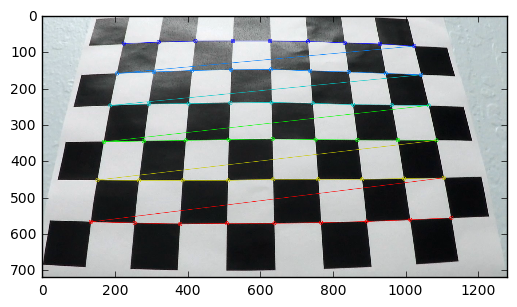

In [3]:
# this process runs through all the calibratin images and creates the checkerboard points needed 
# to develop the calibration matrix

objpoints = []
imgpoints = []

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

for path in checkerboard_file_list: 
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
#     print(ret, path)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
    
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.imshow(img)


True

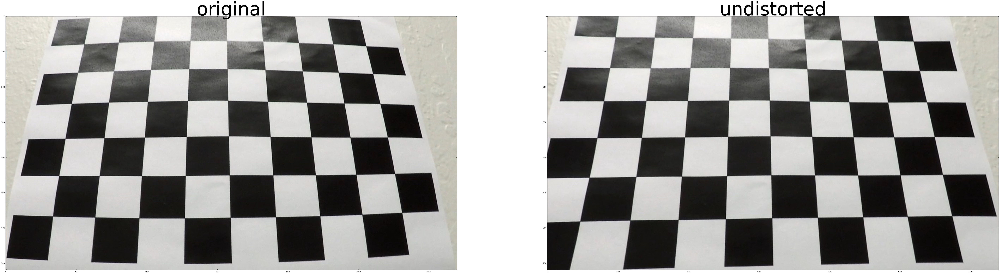

In [4]:
# this function generates the calibration matrix needed to undistort each future image
# from the camera

ret, mtx,dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# undistorting the checkerboard image
image = mpimg.imread('./camera_cal/calibration3.jpg')
undistort = cv2.undistort(image, mtx, dist, None, mtx)

    
font_size = 100
f, (ax1,ax2) = plt.subplots(1,2, figsize=(96,36))
ax1.imshow(image, cmap='gray')
ax1.set_title('original', fontsize = font_size)
ax2.imshow(undistort, cmap='gray')
ax2.set_title('undistorted', fontsize = font_size)

# Writing out a undistorted checkerboard image
cv2.imwrite('test_images/'+ 'checker_undistorted.jpg', cv2.cvtColor(undistort, cv2.COLOR_BGR2RGB))

# Pipeline (single images)

In [5]:
# gradient thresholding functions 


# sobel , which thresholds for the magnitude of the gradient
def abs_sobel_thresh(img, orient='x', sobel_kernel = 3, thresh=(0,255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    # 3) Take the absolute value of the derivative or gradient
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    
    scaled_sobel_x = np.uint8(255*abs_sobel_x / np.max(abs_sobel_x))
    scaled_sobel_y = np.uint8(255*abs_sobel_y / np.max(abs_sobel_y))
    
   
    
    sx_binary = np.zeros_like(scaled_sobel_x)
    sx_binary[(scaled_sobel_x >= thresh[0]) & (scaled_sobel_x <= thresh[1])] = 1  
       
    sy_binary = np.zeros_like(scaled_sobel_y)
    sy_binary[(scaled_sobel_y >= thresh[0]) & (scaled_sobel_y <= thresh[1])] = 1  
    
    if orient == 'x': 
        return sx_binary
        
    if orient == 'y':
        return sy_binary
    
    
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 5) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 6) Create a binary mask where mag thresholds are met
    # 7) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # abs_sobel_x = np.absolute(sobel_x)
    # abs_sobel_y = np.absolute(sobel_y)
    
    # scaled_sobel_x = np.uint8(255*abs_sobel_x / np.max(abs_sobel_x))
    # scaled_sobel_y = np.uint8(255*abs_sobel_y / np.max(abs_sobel_y))
    
    magnitude = np.sqrt((sobel_x**2) + (sobel_y**2))
    scale_factor = np.max(magnitude)/255
    magnitude=  (magnitude/scale_factor).astype(np.uint8)
    
    mag_binary= np.zeros_like(magnitude)
    mag_binary[(magnitude >= mag_thresh[0]) & (magnitude <= mag_thresh[1])] = 1  
      
    # binary_output = np.copy(img) # Remove this line
    return mag_binary


# thresholding the direction 

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    # Here I'm suppressing annoying error messages
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.absolute(np.arctan(sobely/sobelx))
        binary_output =  np.zeros_like(absgraddir)
        binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# color thresholding function 
def hls_select(img, thresh=(0, 255)):

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    binary_output =  np.zeros_like(s)
    binary_output[(s >= thresh[0]) & (s <= thresh[1])] = 1
    return binary_output

In [6]:
# region of interest function to mask the area outside of the lane 
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

# Applying gradients and Color transforms 


In [7]:
# my image process
def process_image(image):
    original = np.copy(image)
    
    # Undistort the frame
    undistort = cv2.undistort(image, mtx, dist, None, mtx)
    
    # gradients and thresholds
    ksize = 3
    sobelx_binary = abs_sobel_thresh(undistort, orient='x', sobel_kernel=ksize, thresh=(20,100))
   
    # color thresholding
    s_binary = hls_select(image, thresh = (100,255))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sobelx_binary)
    combined_binary[(s_binary == 1) | (sobelx_binary == 1)] = 1

    return combined_binary

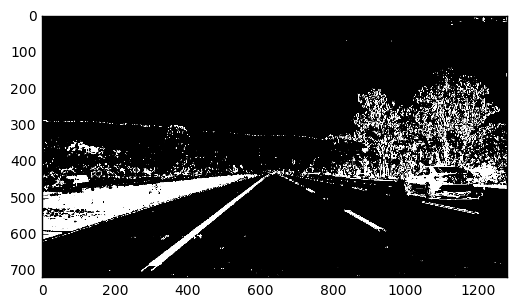

In [13]:
img = mpimg.imread('/home/deep_cat/sdc-P4/test_images/test7.jpg')
binary = process_image(img)
# this thresholds the image for exporting into a visible black and white image
im_bw = cv2.threshold(binary, 0, 255, cv2.THRESH_BINARY)[1]
cv2.imwrite('/home/deep_cat/sdc-P4/test_images/'+ 'test7_binary.jpg', im_bw)

plt.imshow(binary, cmap="gray")


            

In [11]:
np.max(im_bw)

0

# 3. Perspective transformation

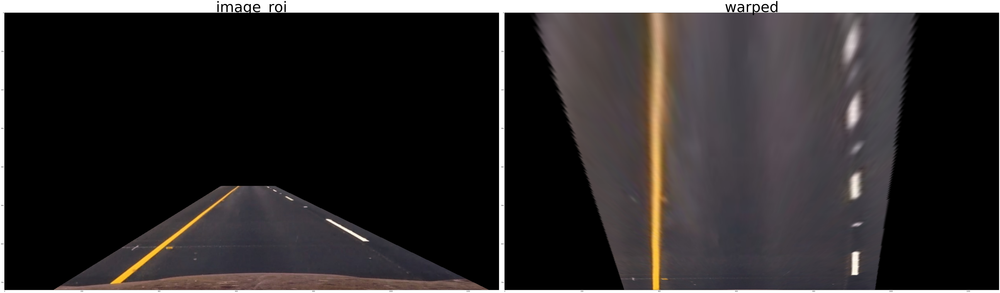

In [32]:
# this is a one time thing to get M and Minv , to be used on future images

# this is also masking the image in a trapezoid made by vertices below

img = mpimg.imread('/home/deep_cat/sdc-P4/test_images/test7.jpg')
img= cv2.undistort(img, mtx, dist, None, mtx)

vertices = np.array([[(127,720),(560, 450), (700,450), (1254,720)]], dtype=np.int32) # also this works without "dtype"
roi = region_of_interest(img, vertices)

243
img_size = (img.shape[1], img.shape[0])
x_offset = 400
y_offset =  0
 # manually picked points 
# src = np.float32([(570,480), (754, 480), (1084, 675), (310, 675)]) 
# src = np.float32([(604,450), (672,450), (1100,683), (330,683)])
# src = np.float32([(592,463), (697,463), (1054,680), (327,680)])


M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst,src) # used later to lay the the polynomials back into the image

warped = cv2.warpPerspective(roi, M, img_size)

    
font_size = 100
f, (ax1,ax2) = plt.subplots(1,2, figsize=(96,36))
f.tight_layout()
ax1.imshow(roi, cmap='gray')
ax1.set_title('image_roi', fontsize = font_size)
ax2.imshow(warped, cmap='gray')
ax2.set_title('warped', fontsize = font_size)
pylab.savefig('/home/deep_cat/sdc-P4/test_images/transform.jpg')


# 4a. Fitting Lane Lines (Step-by-Step)


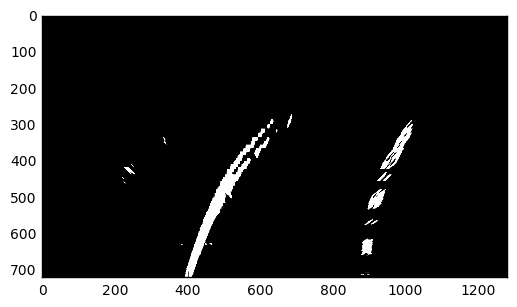

In [275]:
image = mpimg.imread('/home/deep_cat/sdc-P4/test_images/test3.jpg')


processed_binary = process_image(image)
roi = region_of_interest(processed_binary, vertices)
warped = cv2.warpPerspective(roi, M, img_size)

top_bw = cv2.threshold(warped, 0, 255, cv2.THRESH_BINARY)[1]
cv2.imwrite('/home/deep_cat/sdc-P4/test_images/'+ 'warped_binary.jpg', top_bw)
plt.imshow(warped, cmap = 'gray')

/home/deep_cat/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


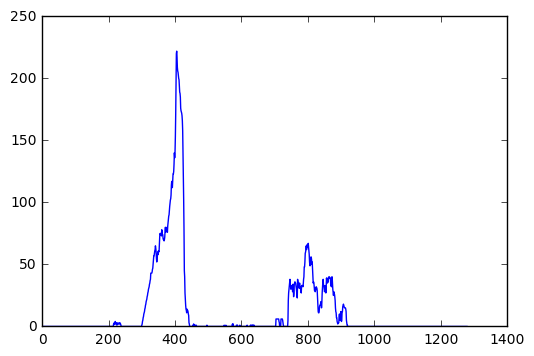

In [245]:
histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
plt.plot(histogram)

In [246]:
peaks = signal.find_peaks_cwt(histogram, [100], min_length = 1,gap_thresh = 2, max_distances=[100]) 

print(peaks)

[389, 813]


In [266]:
# trying to get pixels out of this 
window_width = 100
batch = 72 # 720 / 72  = 10 sliding window 


left_coordinate = peaks[0]
right_coordinate = peaks[1]

left_xCoords = []
left_yCoords= []

right_xCoords = []
right_yCoords = []

draw_img = np.copy(warped)

for i in range(int(warped.shape[0]/batch)):

    ystart = warped.shape[0] - (batch*(i+1))
    yend = ystart + batch

    ############ for left window #############
    xstart = left_coordinate - window_width
    xend = left_coordinate + window_width

    left_window = warped[ystart:yend, xstart: xend] 
    lane_pixels = np.nonzero(left_window)
    
    leftxvals = (lane_pixels[1]+xstart).tolist()
    leftyvals = (lane_pixels[0]+ystart).tolist()
    left_xCoords += leftxvals
    left_yCoords += leftyvals
    
#   update the place to start in next batch
    if not leftxvals: 
        pass
    else:
        
        left_coordinate = xstart + int(np.mean(lane_pixels[1]))
        
        
############ for right window #############
    xstart_r = right_coordinate - window_width
    xend_r = right_coordinate + window_width

    right_window = warped[ystart:yend, xstart_r: xend_r] 
    lane_pixels_r = np.nonzero(right_window)
    
    rightxvals = (lane_pixels_r[1]+xstart_r).tolist()
    rightyvals = (lane_pixels_r[0]+ystart).tolist()
    right_xCoords += rightxvals
    right_yCoords += rightyvals
    
#   update the place to start in next batch
    if not rightxvals: 
        pass
    else:
        
        right_coordinate = xstart_r + int(np.mean(lane_pixels_r[1]))
#     
    
#     print(i, ystart, yend, xstart ,xend, int(np.mean(lane_pixels[1])), left_coordinate)
#     # adjusting the left coordinate, to follow the lane
#     if leftxvals.all() == 0:
#         pass
#     else:
#         left_coordinate = int(np.max(leftxvals))
    
    

#     l_histogram = np.sum(left_window, axis=0)
#     l_peak = int(np.argmax(l_histogram))

#     # adjust the peak location to the total image location
#     left_xCoord = l_peak + xstart
#     left_yCoord = (ystart + yend) / 2

#     if l_peak == 0: 
#         pass
#     else:
#         # append the new x and y locations to the list
#         left_xCoords.append(left_xCoord)
#         left_yCoords.append(left_yCoord)

#         # update the left line coordinate so the window will move with the line
#         left_coordinate = left_xCoord

In [259]:
len(left_xCoords)

21458

In [249]:
window = warped[576:648, 386:486]


In [250]:
pixels = np.nonzero(window)

leftxvals_t = (pixels[1]+386).tolist()


In [251]:
np.mean(pixels)


30.863596872284969

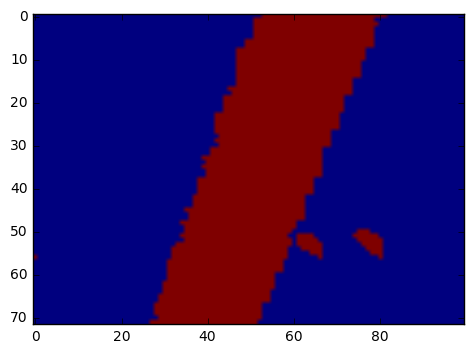

In [252]:
plt.imshow(initial_window)

In [253]:
x = np.nonzero(initial_window)
leftxvals = x[1]+390
leftyvals = x[0]+648

np.mean(leftxvals)


443.17752362008952

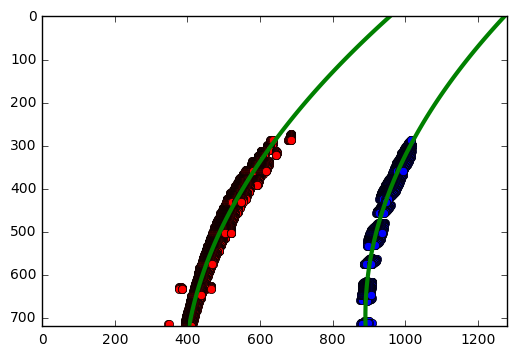

In [276]:
leftyvals = np.asarray(left_yCoords)
leftxvals = np.asarray(left_xCoords)
rightyvals = np.asarray(right_yCoords)
rightxvals = np.asarray(right_xCoords)

# synthetic yvals to make it even
yvals = np.linspace(0, 100, num=101)*7.2

# for the left lane 
left_fit_coefficients = np.polyfit(leftyvals, leftxvals, 2) # creates the coeeficients
left_fitx = left_fit_coefficients[0] * yvals ** 2 + left_fit_coefficients[1] * yvals + left_fit_coefficients[2]

# for the right lane 
right_fit_coefficients = np.polyfit(rightyvals, rightxvals,2) # creates the coeeficients
right_fitx = right_fit_coefficients[0] * yvals ** 2 + right_fit_coefficients[1] * yvals + right_fit_coefficients[2]



plt.plot(leftxvals, leftyvals, 'o', color='red')
plt.plot(rightxvals, rightyvals, 'o', color='blue')
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, yvals, color='green', linewidth=3)
plt.plot(right_fitx, yvals, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images
pylab.savefig('/home/deep_cat/sdc-P4/test_images/points.jpg')

In [ ]:
font_size = 100
f, (ax1,ax2) = plt.subplots(1,2, figsize=(96,36))
f.tight_layout()
ax1.imshow(warped, cmap='gray')
ax1.set_title('image_roi', fontsize = font_size)
ax2.imshow(, cmap='gray')
ax2.set_title('warped', fontsize = font_size)
pylab.savefig('/home/deep_cat/sdc-P4/test_images/transform.jpg')

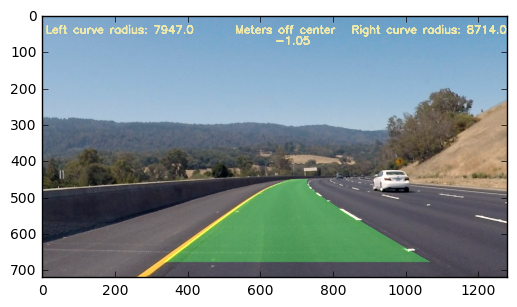

In [280]:
  # Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
pts = np.hstack((pts_left, pts_right))

#  RADIUS OF CURVATURE   
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension

left_fit_cr = np.polyfit(leftyvals*ym_per_pix, leftxvals*xm_per_pix, 2)
right_fit_cr = np.polyfit(rightyvals*ym_per_pix, rightxvals*xm_per_pix, 2)

y_eval = 720
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) \
                             /np.absolute(2*left_fit_cr[0])

right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) \
                                /np.absolute(2*right_fit_cr[0])

# DISTANCE FROM CENTER
screen_middle = image.shape[1]/2
left_lane_x = left_fitx[100]
right_lane_x = right_fitx[0]

lane_middle = (left_lane_x + right_lane_x )/2 
pixels_off_center = screen_middle - lane_middle
meters_off_center = pixels_off_center * xm_per_pix

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
processed_image = cv2.addWeighted(image, 1, newwarp, 0.3, 0) # this wanted the pre-pipeline image for some reason

#printing the text things 
cv2.putText(processed_image,"Left curve radius: "+ str(round(left_curverad)) , (10,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (238,232,170), 3)
cv2.putText(processed_image,"Right curve radius: "+ str(round(right_curverad)) , (850,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (238,232,170), 3)
cv2.putText(processed_image,"Meters off center", (530,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (238,232,170), 3)
cv2.putText(processed_image,str(round(meters_off_center, 2)) , (640,80), cv2.FONT_HERSHEY_SIMPLEX, 1, (238,232,170), 3)

cv2.imwrite('/home/deep_cat/sdc-P4/test_images/'+ 'final_single.jpg',cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
plt.imshow(processed_image)

# 4b. Fitting Lanes (complete function) 

In [281]:
def create_lane_lines(image): 
    original = np.copy(image)
    processed_binary = process_image(image)
    roi = region_of_interest(processed_binary, vertices)
    warped = cv2.warpPerspective(roi, M, img_size)

        # sliding window algorithm 
    histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
    peaks = signal.find_peaks_cwt(histogram, [100], min_length = 1,gap_thresh = 2, max_distances=[100])

    
    # trying to get pixels out of this 
    window_width = 100
    batch = 72 # 720 / 72  = 10 sliding window 


    left_coordinate = peaks[0]
    right_coordinate = peaks[1]

    left_xCoords = []
    left_yCoords= []

    right_xCoords = []
    right_yCoords = []

    draw_img = np.copy(warped)

    for i in range(int(warped.shape[0]/batch)):

        ystart = warped.shape[0] - (batch*(i+1))
        yend = ystart + batch

        ############ for left window #############
        xstart = left_coordinate - window_width
        xend = left_coordinate + window_width

        left_window = warped[ystart:yend, xstart: xend] 
        lane_pixels = np.nonzero(left_window)

        leftxvals = (lane_pixels[1]+xstart).tolist()
        leftyvals = (lane_pixels[0]+ystart).tolist()
        left_xCoords += leftxvals
        left_yCoords += leftyvals

    #   update the place to start in next batch
        if not leftxvals: 
            pass
        else:

            left_coordinate = xstart + int(np.mean(lane_pixels[1]))


    ############ for right window #############
        xstart_r = right_coordinate - window_width
        xend_r = right_coordinate + window_width

        right_window = warped[ystart:yend, xstart_r: xend_r] 
        lane_pixels_r = np.nonzero(right_window)

        rightxvals = (lane_pixels_r[1]+xstart_r).tolist()
        rightyvals = (lane_pixels_r[0]+ystart).tolist()
        right_xCoords += rightxvals
        right_yCoords += rightyvals

    #   update the place to start in next batch
        if not rightxvals: 
            pass
        else:

            right_coordinate = xstart_r + int(np.mean(lane_pixels_r[1]))

    # making the polylines
    leftyvals = np.asarray(left_yCoords)
    leftxvals = np.asarray(left_xCoords)
    rightyvals = np.asarray(right_yCoords)
    rightxvals = np.asarray(right_xCoords)


    
    # synthetic yvals to make it even
    yvals = np.linspace(0, 100, num=101)*7.2

    # for the left lane 
    left_fit_coefficients = np.polyfit(leftyvals, leftxvals, 2) # creates the coeeficients
    left_fitx = left_fit_coefficients[0] * yvals ** 2 + left_fit_coefficients[1] * yvals + left_fit_coefficients[2]

    # for the right lane 
    right_fit_coefficients = np.polyfit(rightyvals, rightxvals,2) # creates the coeeficients
    right_fitx = right_fit_coefficients[0] * yvals ** 2 + right_fit_coefficients[1] * yvals + right_fit_coefficients[2]

    #  RADIUS OF CURVATURE   
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension

    left_fit_cr = np.polyfit(leftyvals*ym_per_pix, leftxvals*xm_per_pix, 2)
    right_fit_cr = np.polyfit(rightyvals*ym_per_pix, rightxvals*xm_per_pix, 2)

    y_eval = 720
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])

    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))

    # DISTANCE FROM CENTER
    screen_middle = image.shape[1]/2
    left_lane_x = left_fitx[100]
    right_lane_x = right_fitx[0]
    
    lane_middle = (left_lane_x + right_lane_x )/2 
    pixels_off_center = screen_middle - lane_middle
    meters_off_center = pixels_off_center * xm_per_pix

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    processed_image = cv2.addWeighted(original, 1, newwarp, 0.3, 0) # this wanted the pre-pipeline image for some reason 
    
    #printing the text things 
    cv2.putText(processed_image,"Left curve radius: "+ str(round(left_curverad)) , (10,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (238,232,170), 3)
    cv2.putText(processed_image,"Right curve radius: "+ str(round(right_curverad)) , (850,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (238,232,170), 3)
    cv2.putText(processed_image,"Meters off center", (530,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (238,232,170), 3)
    cv2.putText(processed_image,str(round(meters_off_center, 2)) , (640,80), cv2.FONT_HERSHEY_SIMPLEX, 1, (238,232,170), 3)
    return processed_image

/home/deep_cat/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


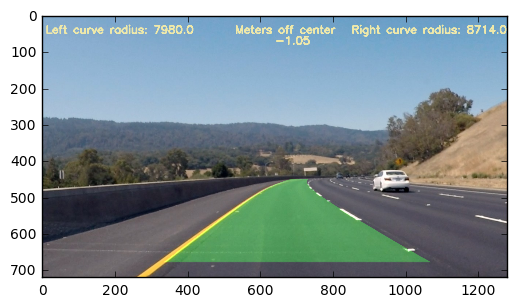

In [282]:
image = mpimg.imread('/home/deep_cat/sdc-P4/test_images/test3.jpg')
lines_image = create_lane_lines(image)
plt.imsave('/home/deep_cat/sdc-P4/test_images/lines_image.jpg', lines_image)
plt.imshow(lines_image)

# Pipeline Video

In [283]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [284]:
# running the pipeline on the video
output_name = 'project_video_output_newprocess.mp4'
clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(create_lane_lines)
output_clip.write_videofile(output_name, audio= False)

[MoviePy] >>>> Building video project_video_output_newprocess.mp4
[MoviePy] Writing video project_video_output_newprocess.mp4


100%|█████████▉| 1260/1261 [02:46<00:00,  7.59it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_newprocess.mp4 



In [285]:
HTML("""
<video width="480" height="270" controls>
  <source src="{0}">
</video>
""".format(output_name))